## Подготовительная работа
* [Installing a Library Permanently in Colab](https://saturncloud.io/blog/how-to-install-a-library-permanently-in-colab/)

In [1]:
## connect google drive
from google.colab import drive


drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install virtualenv
!virtualenv /content/drive/MyDrive/vkr/kmu/virtual_env

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.9/3.9 MB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 468.9/468.9 kB 22.9 MB/s eta 0:00:00
created virtual environment CPython3.10.12.final.0-64 in 29675ms
  creator CPython3Posix(dest=/content/drive/MyDrive/vkr/kmu/virtual_env, clear=False, no_vcs_ignore=False, global=False)
  seeder FromAppData(download=False, pip=bundle, setuptools=bundle, wheel=bundle, via=copy, app_data_dir=/root/.local/share/virtualenv)
    added seed packages: Babel==2.14.0, Cython==0.29.37, DAWG_Python==0.7.2, Deprecated==1.2.14, Janome==0.5.0, Jinja2==3.1.3, MarkupSafe==2.1.5, PySocks==1.7.1, PyYAML==6.0.1, Wikipedia_API==0.6.0, affine==2.4.0, aiohttp==3.9.3, aiosignal==1.3.1, alabaster==0.7.16, async_timeout==4.0.3, attrs==23.2.0, autodocsumm==0.2.12, beautifulsoup4==4.12.3, blosc2==2.6.1, boto3==1.34.80, botocore==1.34.80, bpemb==0.3.5, certifi==2024.2.2, charset_normalizer==3.3.2, click==8.1.7, click_plugins==1.1.1, cligj==0.7.2, cloudpi

In [3]:
import sys


venv_path = "/content/drive/MyDrive/vkr/kmu/virtual_env/lib/python3.10/site-packages"
if venv_path not in sys.path:
  # add the path of the virtual environment site-packages to colab system path
  sys.path.append(venv_path)
sys.path

['/content',
 '/env/python',
 '/usr/lib/python310.zip',
 '/usr/lib/python3.10',
 '/usr/lib/python3.10/lib-dynload',
 '',
 '/usr/local/lib/python3.10/dist-packages',
 '/usr/lib/python3/dist-packages',
 '/usr/local/lib/python3.10/dist-packages/IPython/extensions',
 '/root/.ipython',
 '/content/drive/MyDrive/vkr/kmu/virtual_env/lib/python3.10/site-packages']

## Выгрузка данных из OSM

```bash
!source /content/drive/MyDrive/vkr/kmu/virtual_env/bin/activate; pip install pyrosm contextily mapclassify osmnx
```

In [ ]:
!pip freeze

### Конфигурация

In [164]:
DIR_OSM = '/content/drive/MyDrive/vkr/kmu/src/osm/'
CITY = 'SanktPetersburg'
##BBOX = [30.2561753, 59.929385, 30.3637657, 59.9832816]
BBOX = [30.2665719, 59.8913232, 30.4101337, 59.9632426]
UTM_ZONE = 32636

config = {
    'dir_osm': DIR_OSM,
    'city': CITY,
    'crs': UTM_ZONE,
    'filters': {
        'buildings': {
            'all': {
                'building': True
            },
            'residential_only': {
                'building': [
                'apartments',
                'residential'
              ]
            }
        },
        'POIs': {
            'shop': [
                'convenience',
                'supermarket',
                'mall',
                'greengrocer'
            ],
            'amenity': [
                'pharmacy',
                'university',
                'school',
                'kindergarten',
                'clinic',
                'car_wash'
            ],
            'healthcare': [
                'clinic'
            ]
        },
        'network_type': [
            'walking',
            'driving'
        ]
    },
    'bbox': BBOX
}

### Логирование

<details>
<summary> Log levels</summary>

```py
logging.debug("A DEBUG Message")
logging.info("An INFO")
logging.warning("A WARNING")
logging.error("An ERROR")
logging.critical("A message of CRITICAL severity")
```
</details>

In [ ]:
!pwd

/content


In [15]:
import logging
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

logger = logging.getLogger()
fhandler = logging.FileHandler(filename=config["dir_osm"]+'get_osm_data_'+start+'.log', mode='w')
logger.addHandler(fhandler)
logger.setLevel(logging.INFO)

### All data

In [16]:
from pyrosm import get_data, OSM


# download data for the city
fp = get_data(dataset=config['city'], directory=config['dir_osm'])
logger.info(f'data was downloaded to {fp}')

INFO:numexpr.utils:NumExpr defaulting to 2 threads.
INFO:root:data was downloaded to /content/drive/MyDrive/vkr/kmu/src/osm/SanktPetersburg.osm.pbf


In [17]:
if 'bbox' in config:
  osm = OSM(fp, bounding_box=config['bbox'])
  logger.info(f'work with bbox: {config["bbox"]}')
else:
  osm = OSM(fp)
  logger.info(f'work with all city: {config["city"]}')

INFO:root:work with bbox: [30.2665719, 59.8913232, 30.4101337, 59.9632426]


### Buildings

In [136]:
buildings_type = config['filters']['buildings']['residential_only']
#buildings_type = config["filters"]["buildings"]["all"]

buildings = osm.get_data_by_custom_criteria(custom_filter=buildings_type, tags_as_columns=['building', 'building:levels', 'addr:country', 'addr:city', 'addr:street', 'addr:housenumber', 'lon', 'lat', 'osm_type']).set_index('id')
logger.info(f'get buildings by filter {buildings_type}')

INFO:root:get buildings by filter {'building': ['apartments', 'residential']}


In [137]:
buildings.head(2)

,building,building:levels,addr:country,addr:city,addr:street,addr:housenumber,timestamp,version,tags,osm_type,geometry,changeset
id,,,,,,,,,,,,
22967564,apartments,5,RU,Санкт-Петербург,Кронверкский проспект,63/31,0,-1,"{""visible"":false,""addr2:street"":""\u0443\u043B\...",way,"POLYGON ((30.30642 59.95424, 30.30640 59.95422...",NaN
23088593,apartments,5,None,None,улица Стахановцев,9,0,-1,"{""visible"":false,""addr:postcode"":""195196"",""bui...",way,"POLYGON ((30.40793 59.92655, 30.40799 59.92650...",NaN


In [138]:
buildings = buildings.rename(columns={'building:levels': 'levels',
                          'addr:country': 'country',
                          'addr:city': 'city',
                          'addr:street':'street',
                          'addr:housenumber': 'housenumber'})

In [139]:
buildings.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 3102 entries, 22967564 to 345841666361
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   building     3102 non-null   object  
 1   levels       2818 non-null   object  
 2   country      1035 non-null   object  
 3   city         1333 non-null   object  
 4   street       3089 non-null   object  
 5   housenumber  3089 non-null   object  
 6   timestamp    3102 non-null   uint32  
 7   version      3102 non-null   int32   
 8   tags         3102 non-null   object  
 9   osm_type     3102 non-null   object  
 10  geometry     3102 non-null   geometry
 11  changeset    685 non-null    float64 
dtypes: float64(1), geometry(1), int32(1), object(8), uint32(1)
memory usage: 290.8+ KB


In [140]:
buildings.version.value_counts()

version
-1    3102
Name: count, dtype: int64

In [141]:
buildings.osm_type.value_counts()

osm_type
way         2417
relation     685
Name: count, dtype: int64

In [142]:
buildings.housenumber.isnull().sum()

13

In [143]:
buildings = buildings.dropna(subset=["housenumber"])
logger.info(f'drop buildings without housenumber')

INFO:root:drop buildings without housenumber


In [144]:
if 'lon' in buildings.columns or 'lat' in buildings.columns:
  buildings = buildings.drop(index=buildings[buildings.lon.notna() == True].index)
  logger.info('drop point buildings')

In [145]:
buildings = buildings[['building', 'levels', 'country', 'city', 'street', 'housenumber', 'osm_type', 'geometry']].to_crs(config['crs'])
logger.info(f'project buildings to {buildings.crs.to_string()}')

INFO:root:project buildings to EPSG:32636


POINT(x, y)
* x --> lon (долгота)
* y --> lat (широта)

In [146]:
buildings.head(2)

,building,levels,country,city,street,housenumber,osm_type,geometry
id,,,,,,,,
22967564,apartments,5,RU,Санкт-Петербург,Кронверкский проспект,63/31,way,"POLYGON ((349578.732 6649376.838, 349577.244 6..."
23088593,apartments,5,None,None,улица Стахановцев,9,way,"POLYGON ((355124.500 6646068.154, 355127.464 6..."


In [147]:
buildings.country.value_counts()

country
RU    1035
Name: count, dtype: int64

In [148]:
buildings.city.value_counts()

city
Санкт-Петербург    1333
Name: count, dtype: int64

In [149]:
buildings.country = buildings.country.fillna('RU')
buildings.city = buildings.city.fillna('Санкт-Петербург')

In [150]:
buildings['centroid'] = buildings.centroid
buildings['centroid_x'] = buildings.centroid.x
buildings['centroid_y'] = buildings.centroid.y

logger.info(f'add building centroid')

INFO:root:add building centroid


In [151]:
buildings.head(2)

,building,levels,country,city,street,housenumber,osm_type,geometry,centroid,centroid_x,centroid_y
id,,,,,,,,,,,
22967564,apartments,5,RU,Санкт-Петербург,Кронверкский проспект,63/31,way,"POLYGON ((349578.732 6649376.838, 349577.244 6...",POINT (349568.605 6649377.134),349568.604639,6.649377e+06
23088593,apartments,5,RU,Санкт-Петербург,улица Стахановцев,9,way,"POLYGON ((355124.500 6646068.154, 355127.464 6...",POINT (355125.227 6646045.149),355125.226808,6.646045e+06


INFO:root:save buildings to /content/drive/MyDrive/vkr/kmu/src/osm/images/buildings_2024_05_06.png


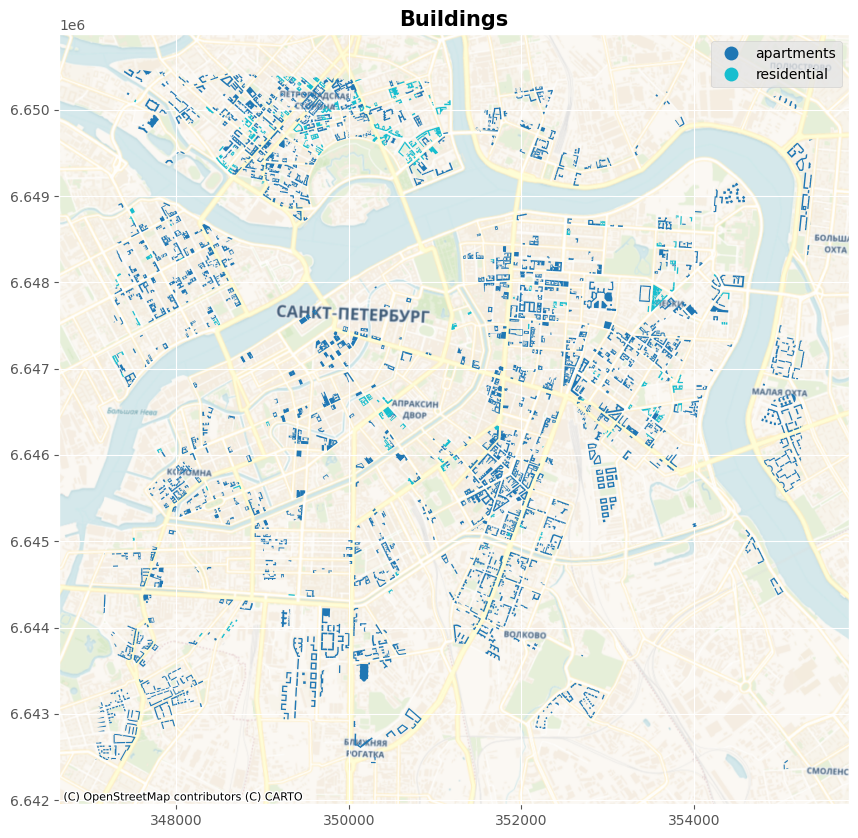

In [153]:
import contextily as cx
from matplotlib import pyplot as plt
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

with plt.style.context("ggplot"):
  ax = buildings.plot(column='building', figsize=(20, 10), legend=True, linewidth=0.4, legend_kwds=dict(loc='upper right', ncol=1))
  #ax = buildings['centroid'].plot(ax=ax, markersize=2)
  cx.add_basemap(ax=ax, crs=buildings.crs.to_string(), source=cx.providers.CartoDB.Voyager)
  ax.set_title('Buildings', fontsize=15, fontweight='bold')
  fp = config['dir_osm']+'images/buildings_'+start+'.png'
  plt.savefig(fp, bbox_inches='tight')
  logger.info(f'save buildings to {fp}')
  plt.show()

INFO:root:save buildings to /content/drive/MyDrive/vkr/kmu/src/osm/images/buildings_zoom_2024_05_06.png


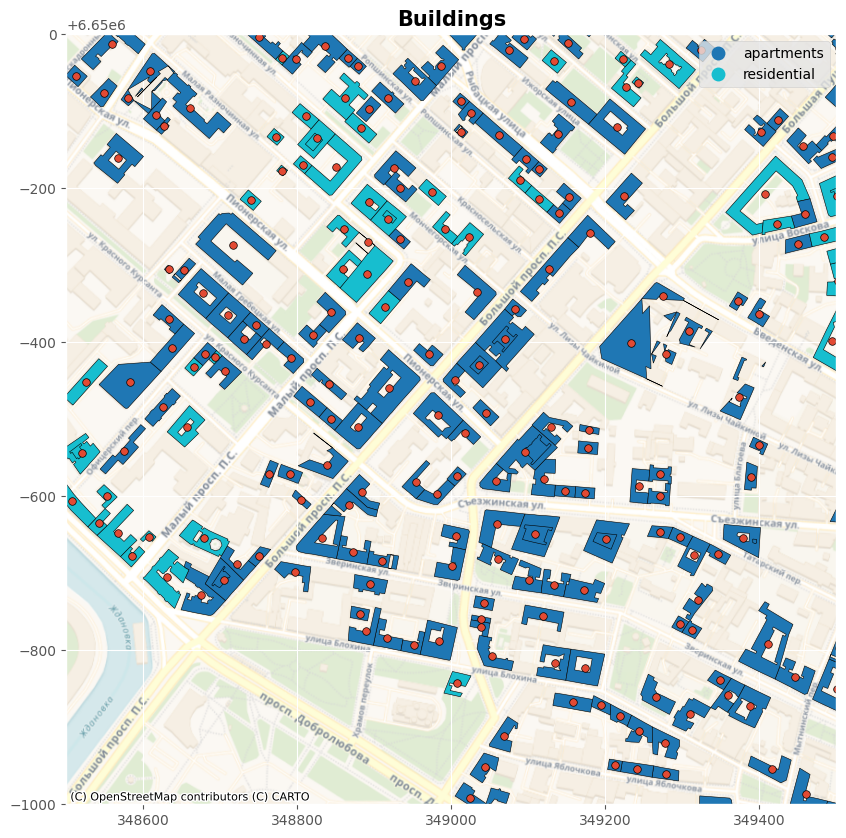

In [154]:
import contextily as cx
from matplotlib import pyplot as plt
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

with plt.style.context("ggplot"):
  ax = buildings.plot(column='building', edgecolor='black', figsize=(20, 10), legend=True, linewidth=0.4, legend_kwds=dict(loc='upper right', ncol=1))
  ax = buildings['centroid'].plot(ax=ax, edgecolor='black', markersize=30)
  #plt.setp(ax, xlim=(352000, 353000), ylim=(6647000, 6648000))
  plt.setp(ax, xlim=(348500, 349500), ylim=(6649000, 6650000))

  cx.add_basemap(ax=ax, crs=buildings.crs.to_string(), source=cx.providers.CartoDB.Voyager)

  ax.set_title('Buildings', fontsize=15, fontweight='bold')
  fp = config['dir_osm']+'images/buildings_zoom_'+start+'.png'
  plt.savefig(fp, bbox_inches='tight')
  logger.info(f'save buildings to {fp}')
  plt.show()


In [ ]:
#buildings.explore(column='building', tiles="CartoDB positron")

In [155]:
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

fp = ''
if 'bbox' in config:
  fp = DIR_OSM + 'spb_bbox_' + start + '.gpkg'
  buildings.drop(columns='centroid').to_file(fp, driver='GPKG', layer='buildings', encoding='utf-8')
  logger.info(f'save buildings to {fp}')
else:
  fp = DIR_OSM + 'spb_' + start + '.gpkg'
  buildings.drop(columns='centroid').to_file(fp, driver='GPKG', layer='buildings', encoding='utf-8')
  logger.info(f'save buildings to {fp}')

INFO:root:save buildings to /content/drive/MyDrive/vkr/kmu/src/osm/spb_bbox_2024_05_06.gpkg


In [156]:
from geopandas import read_file


buildings_from_gpkg = read_file(fp, layer='buildings').set_index('id')

if buildings.shape[0] == buildings_from_gpkg.shape[0] and buildings.crs == buildings_from_gpkg.crs:
  logger.info(f'buildings successfully loaded from gpkg')

buildings_from_gpkg.head(2)

INFO:root:buildings successfully loaded from gpkg


,building,levels,country,city,street,housenumber,osm_type,centroid_x,centroid_y,geometry
id,,,,,,,,,,
22967564,apartments,5,RU,Санкт-Петербург,Кронверкский проспект,63/31,way,349568.604639,6.649377e+06,"POLYGON ((349578.732 6649376.838, 349577.244 6..."
23088593,apartments,5,RU,Санкт-Петербург,улица Стахановцев,9,way,355125.226808,6.646045e+06,"POLYGON ((355124.500 6646068.154, 355127.464 6..."


### POIs

In [244]:
pois_type = config["filters"]["POIs"]

pois = osm.get_data_by_custom_criteria(custom_filter=pois_type, tags_as_columns=["shop", "amenity", "healthcare", "name"]).set_index('id')
logger.info(f'get pois by filter {pois_type}')

INFO:root:get pois by filter {'shop': ['convenience', 'supermarket', 'mall', 'greengrocer'], 'amenity': ['pharmacy', 'university', 'school', 'kindergarten', 'clinic', 'car_wash'], 'healthcare': ['clinic']}


In [245]:
pois.head(2)

,tags,lon,lat,timestamp,visible,changeset,version,shop,amenity,healthcare,name,geometry,osm_type
id,,,,,,,,,,,,,
311101154,"{""check_date"":""2024-02-09"",""contact:vk"":""https...",30.288015,59.924850,0,False,0.0,0,None,pharmacy,pharmacy,У театра,POINT (30.28802 59.92485),node
311101166,"{""check_date"":""2023-02-22"",""contact:email"":""do...",30.288784,59.924694,0,False,0.0,0,None,kindergarten,None,Детский сад № 60,POINT (30.28878 59.92469),node


In [246]:
pois.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 2079 entries, 311101154 to 339932962716
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   tags        2020 non-null   object  
 1   lon         1623 non-null   float32 
 2   lat         1623 non-null   float32 
 3   timestamp   2079 non-null   uint32  
 4   visible     1623 non-null   object  
 5   changeset   1711 non-null   float64 
 6   version     2079 non-null   int32   
 7   shop        984 non-null    object  
 8   amenity     1098 non-null   object  
 9   healthcare  475 non-null    object  
 10  name        1915 non-null   object  
 11  geometry    2079 non-null   geometry
 12  osm_type    2079 non-null   object  
dtypes: float32(2), float64(1), geometry(1), int32(1), object(7), uint32(1)
memory usage: 194.9+ KB


In [247]:
pois.version.value_counts()

version
 0    1623
-1     456
Name: count, dtype: int64

In [248]:
pois.osm_type.value_counts()

osm_type
node        1623
way          368
relation      88
Name: count, dtype: int64

In [249]:
pois.name.isnull().sum()

164

In [250]:
pois = pois.dropna(subset=["name"])
logger.info(f'drop unnamed pois')

INFO:root:drop unnamed pois


In [251]:
pois.shape

(1915, 13)

In [252]:
pois.loc[~pois.shop.isin(config['filters']['POIs']['shop']), 'shop'] = ""
pois.loc[~pois.amenity.isin(config['filters']['POIs']['amenity']), 'amenity'] = ""
pois.loc[~pois.healthcare.isin(config['filters']['POIs']['healthcare']), 'healthcare'] = ""

pois['pois'] = pois.shop + pois.amenity + pois.healthcare
pois.loc[pois.pois == 'clinicclinic', 'pois'] = 'clinic'

logger.info(f'add pois type')

INFO:root:add pois type


In [253]:
pois['pois_cat'] = ''

In [254]:
pois.loc[pois.shop.isin(config['filters']['POIs']['shop']), 'pois_cat'] = "shop"
pois.loc[pois.pois == 'pharmacy', 'pois_cat'] = "pharmacy"
pois.loc[pois.pois.isin(['university', 'school', 'kindergarten']), 'pois_cat'] = "education"
pois.loc[pois.pois == 'clinic', 'pois_cat'] = "clinics"
#leisure
pois.loc[pois.pois == 'car_wash', 'pois_cat'] = "custom"

logger.info(f'add pois category')

INFO:root:add pois category


In [255]:
pois.head(2)

,tags,lon,lat,timestamp,visible,changeset,version,shop,amenity,healthcare,name,geometry,osm_type,pois,pois_cat
id,,,,,,,,,,,,,,,
311101154,"{""check_date"":""2024-02-09"",""contact:vk"":""https...",30.288015,59.924850,0,False,0.0,0,,pharmacy,,У театра,POINT (30.28802 59.92485),node,pharmacy,pharmacy
311101166,"{""check_date"":""2023-02-22"",""contact:email"":""do...",30.288784,59.924694,0,False,0.0,0,,kindergarten,,Детский сад № 60,POINT (30.28878 59.92469),node,kindergarten,education


In [204]:
pois.pois_cat.value_counts()

pois_cat
shop         881
education    513
pharmacy     331
clinics      165
custom        25
Name: count, dtype: int64

In [256]:
pois = pois[['pois', 'pois_cat', 'name', 'osm_type', 'geometry']].to_crs(config['crs'])
logger.info(f'project pois to {pois.crs.to_string()}')
pois.head(2)

INFO:root:project pois to EPSG:32636


,pois,pois_cat,name,osm_type,geometry
id,,,,,
311101154,pharmacy,pharmacy,У театра,node,POINT (348417.017 6646147.340)
311101166,kindergarten,education,Детский сад № 60,node,POINT (348459.251 6646128.172)


In [257]:
pois['geometry'] = pois.centroid
pois['centroid_x'] = pois.geometry.x
pois['centroid_y'] = pois.geometry.y

logger.info(f'replace pois geometry to centroid')

INFO:root:replace pois geometry to centroid


In [217]:
pois.head(2)

,pois,pois_cat,name,osm_type,geometry,centroid_x,centroid_y
id,,,,,,,
311101154,pharmacy,pharmacy,У театра,node,POINT (348417.017 6646147.340),348417.017363,6.646147e+06
311101166,kindergarten,education,Детский сад № 60,node,POINT (348459.251 6646128.172),348459.251380,6.646128e+06


INFO:root:save pois to /content/drive/MyDrive/vkr/kmu/src/osm/images/pois_2024_05_06.png


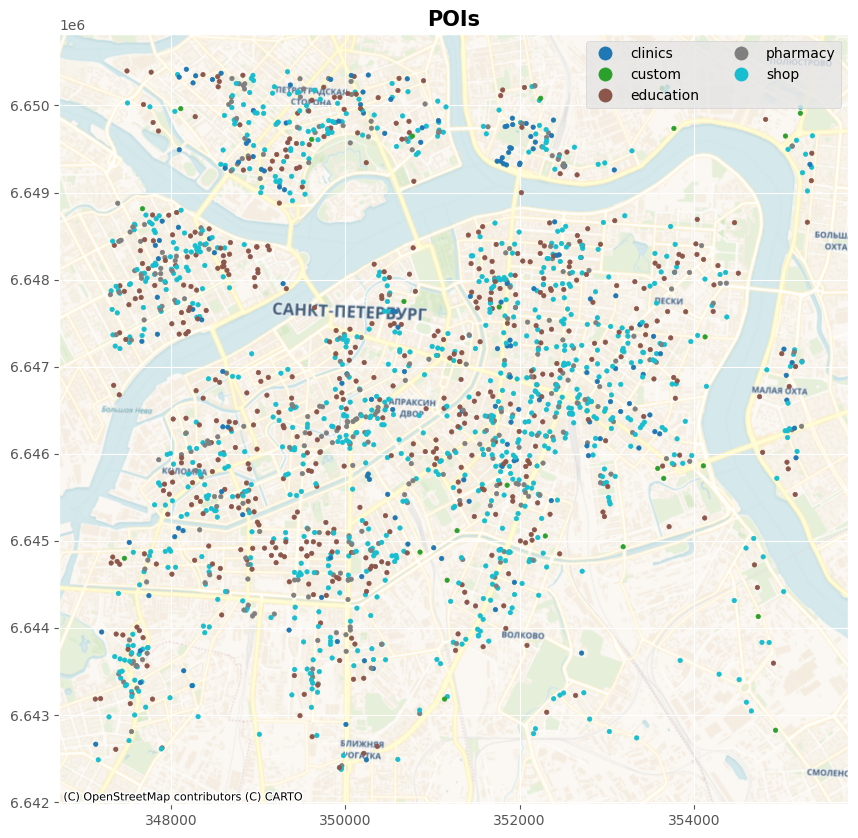

In [258]:
import contextily as cx
from matplotlib import pyplot as plt
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

with plt.style.context('ggplot'):
  ax = pois.plot(column='pois_cat', figsize=(20,10), legend=True, markersize=10, legend_kwds=dict(loc='upper right', ncol=2))
  cx.add_basemap(ax=ax, crs=pois.crs.to_string(), source=cx.providers.CartoDB.Voyager)
  ax.set_title('POIs', fontsize=15, fontweight='bold')
  fp = config['dir_osm']+'images/pois_'+start+'.png'
  plt.savefig(fp, bbox_inches='tight')
  logger.info(f'save pois to {fp}')
  plt.show()

INFO:root:save pois to /content/drive/MyDrive/vkr/kmu/src/osm/images/pois_zoom_2024_05_06.png


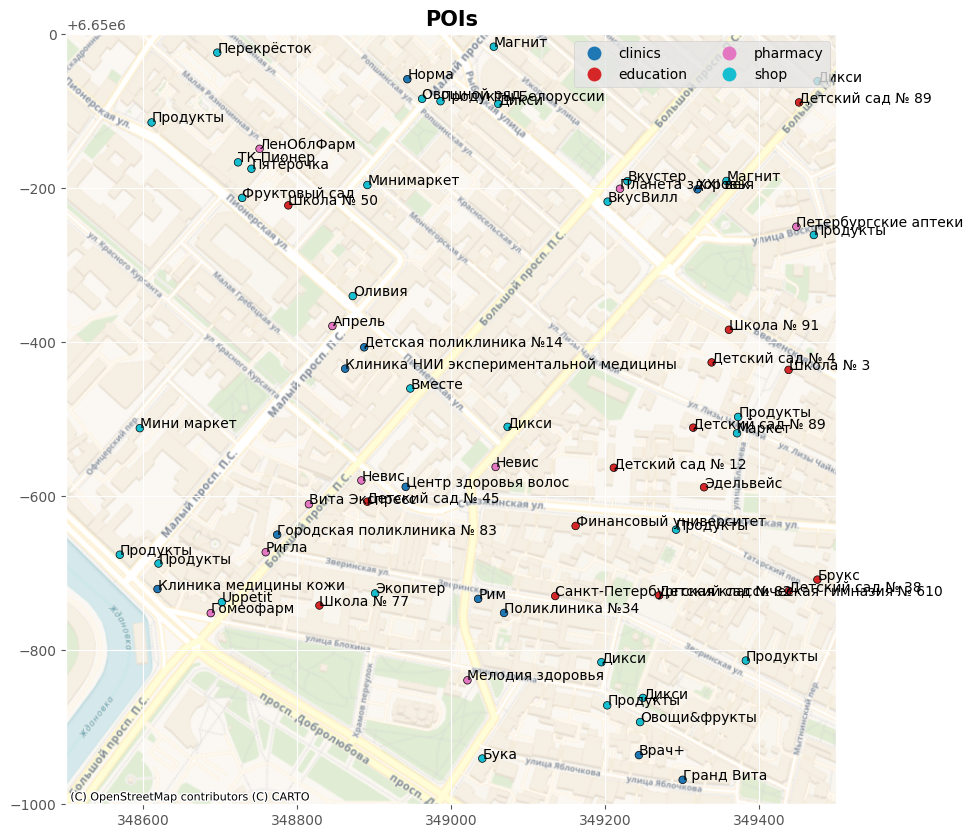

In [259]:
import contextily as cx
from matplotlib import pyplot as plt
import datetime

# function to add value labels
def addlabels(x, y, s):
    for i in range(len(x)):
        plt.text(x.iloc[i], y.iloc[i], s.iloc[i], fontsize = 10)

start = datetime.datetime.today().strftime("%Y_%m_%d")

pois_zoom = pois[((348500 <= pois.centroid_x) & (pois.centroid_x <= 349500)) & ((6649000 <= pois.centroid_y) & (pois.centroid_y <= 6650000))]

with plt.style.context('ggplot'):
  ax = pois_zoom.plot(column='pois_cat', figsize=(20, 10), legend=True, edgecolor='black', markersize=30, legend_kwds=dict(loc='upper right', ncol=2))
  #plt.setp(ax, xlim=(352000, 353000), ylim=(6647000, 6648000))
  plt.setp(ax, xlim=(348500, 349500), ylim=(6649000, 6650000))
  # calling the function to add value labels
  addlabels(pois_zoom.centroid_x, pois_zoom.centroid_y, pois_zoom.name)

  cx.add_basemap(ax=ax, crs=pois_zoom.crs.to_string(), source=cx.providers.CartoDB.Voyager)
  ax.set_title('POIs', fontsize=15, fontweight='bold')

  fp = config['dir_osm']+'images/pois_zoom_'+start+'.png'
  plt.savefig(fp, bbox_inches='tight')
  logger.info(f'save pois to {fp}')
  plt.show()

In [ ]:
#pois.explore(column='pois', tiles="CartoDB positron")

In [260]:
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

fp = ''
if 'bbox' in config:
  fp = DIR_OSM + 'spb_bbox_' + start + '.gpkg'
  pois.to_file(fp, driver='GPKG', layer='pois', encoding='utf-8')
  logger.info(f'save pois to {fp}')
else:
  fp = DIR_OSM + 'spb_' + start + '.gpkg'
  pois.to_file(fp, driver='GPKG', layer='pois', encoding='utf-8')
  logger.info(f'save pois to {fp}')

INFO:root:save pois to /content/drive/MyDrive/vkr/kmu/src/osm/spb_bbox_2024_05_06.gpkg


In [261]:
from geopandas import read_file


pois_from_gpkg = read_file(fp, layer='pois').set_index('id')

if pois.shape[0] == pois_from_gpkg.shape[0] and pois.crs == pois_from_gpkg.crs:
  logger.info(f'pois successfully loaded from gpkg')

pois_from_gpkg.head(2)

INFO:root:pois successfully loaded from gpkg


,pois,pois_cat,name,osm_type,centroid_x,centroid_y,geometry
id,,,,,,,
311101154,pharmacy,pharmacy,У театра,node,348417.017363,6.646147e+06,POINT (348417.017 6646147.340)
311101166,kindergarten,education,Детский сад № 60,node,348459.251380,6.646128e+06,POINT (348459.251 6646128.172)


### Network

In [282]:
network_type = config['filters']['network_type'][0]
#network_type = config['filters']['network_type'][1]

nodes, edges = osm.get_network(nodes=True, network_type=network_type)

if network_type == 'walking':
  logger.info(f'get {network_type} nodes and edges by exclude filter {osm.conf.network_filters.walking}')
  edges.oneway = edges.oneway.fillna('no')

  indexes = [i for i, flag in edges.oneway.items() if type(flag) != str]
  edges.loc[indexes, 'oneway'] = 'no'

  indexes = [i for i, flag in edges.highway.items() if type(flag) != str]
  edges.loc[indexes, 'highway'] = edges.highway.value_counts().index[0] # 'footway'


elif network_type == 'driving':
  logger.info(f'get {network_type} nodes and edges by exclude filter {osm.conf.network_filters.driving}')
  edges.oneway = edges.oneway.fillna('yes')

  indexes = [i for i, flag in edges.oneway.items() if type(flag) != str]
  edges.loc[indexes, 'oneway'] = 'yes'

  indexes = [i for i, flag in edges.highway.items() if type(flag) != str]
  edges.loc[indexes, 'highway'] = edges.highway.value_counts().index[0] # 'service'

INFO:root:get walking nodes and edges by exclude filter {'area': ['yes'], 'highway': ['cycleway', 'motor', 'proposed', 'construction', 'abandoned', 'platform', 'raceway', 'motorway', 'motorway_link'], 'foot': ['no'], 'service': ['private']}


In [283]:
nodes.head(2)

,tags,lon,lat,timestamp,visible,changeset,version,id,geometry
0,None,30.328836,59.940681,0,False,0,0,10240355599,POINT (30.32884 59.94068)
1,"{'direction': 'backward', 'highway': 'give_way'}",30.328846,59.940708,0,False,0,0,4580318560,POINT (30.32885 59.94071)


In [284]:
nodes.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 135251 entries, 0 to 135252
Data columns (total 9 columns):
 #   Column     Non-Null Count   Dtype   
---  ------     --------------   -----   
 0   tags       19779 non-null   object  
 1   lon        135251 non-null  float64 
 2   lat        135251 non-null  float64 
 3   timestamp  135251 non-null  int64   
 4   visible    135251 non-null  bool    
 5   changeset  135251 non-null  int64   
 6   version    135251 non-null  int64   
 7   id         135251 non-null  int64   
 8   geometry   135251 non-null  geometry
dtypes: bool(1), float64(2), geometry(1), int64(4), object(1)
memory usage: 9.4+ MB


In [285]:
edges.head(2)

,access,area,bicycle,bridge,busway,foot,footway,highway,junction,lanes,...,width,id,timestamp,version,tags,osm_type,geometry,u,v,length
0,None,None,None,None,None,None,None,unclassified,None,1,...,None,4454526,0,-1,"{""visible"":false,""name:ru"":""\u043D\u0430\u0431...",way,"LINESTRING (30.32884 59.94068, 30.32885 59.94071)",10240355599,4580318560,3.016
1,None,None,None,None,None,None,None,unclassified,None,1,...,None,4454526,0,-1,"{""visible"":false,""name:ru"":""\u043D\u0430\u0431...",way,"LINESTRING (30.32885 59.94071, 30.32888 59.94081)",4580318560,1591433310,11.231


In [286]:
edges.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 150655 entries, 0 to 150654
Data columns (total 35 columns):
 #   Column         Non-Null Count   Dtype   
---  ------         --------------   -----   
 0   access         13025 non-null   object  
 1   area           3 non-null       object  
 2   bicycle        251 non-null     object  
 3   bridge         598 non-null     object  
 4   busway         3 non-null       object  
 5   foot           275 non-null     object  
 6   footway        37086 non-null   object  
 7   highway        150655 non-null  object  
 8   junction       10 non-null      object  
 9   lanes          2200 non-null    object  
 10  lit            29392 non-null   object  
 11  maxspeed       2590 non-null    object  
 12  motorcar       10 non-null      object  
 13  motor_vehicle  389 non-null     object  
 14  name           3239 non-null    object  
 15  oneway         150655 non-null  object  
 16  psv            116 non-null     object  
 17  re

In [287]:
graph = osm.to_graph(nodes, edges, graph_type='networkx')
logger.info(f'convert {network_type} nodes and edges to networkx graph')

INFO:root:convert walking nodes and edges to networkx graph


In [288]:
from osmnx import simplify_graph, graph_to_gdfs


graph_s = simplify_graph(graph)
logger.info(f'simplify {network_type} graph')

nodes_s = graph_to_gdfs(graph_s, edges=False)
edges_s = graph_to_gdfs(graph_s, nodes=False)
logger.info(f'get {network_type} nodes and edges of simplified graph')

if network_type == 'walking':
  edges_s.oneway = edges_s.oneway.fillna('no')

  indexes = [i for i, flag in edges_s.oneway.items() if type(flag)!= str]
  edges_s.loc[indexes, 'oneway'] = 'no'

  indexes = [i for i, flag in edges_s.highway.items() if type(flag) != str]
  edges_s.loc[indexes, 'highway'] = edges_s.highway.value_counts().index[0] # 'footway'

elif network_type == 'driving':
  edges_s.oneway = edges_s.oneway.fillna('yes')
  indexes = [i for i, flag in edges_s.oneway.items() if type(flag) != str]
  edges_s.loc[indexes, 'oneway'] = 'yes'

  indexes = [i for i, flag in edges_s.highway.items() if type(flag) != str]
  edges_s.loc[indexes, 'highway'] = edges_s.highway.value_counts().index[0] # 'service'

INFO:root:simplify walking graph
INFO:root:get walking nodes and edges of simplified graph


In [289]:
nodes_s = nodes_s.rename(columns={'osmid':'id'}).set_index('id')[['geometry']].to_crs(config['crs'])
nodes_s['x'] = nodes_s.geometry.x
nodes_s['y'] = nodes_s.geometry.y
logger.info(f'project {network_type} nodes to {nodes_s.crs.to_string()}')
nodes_s.head(2)

INFO:root:project walking nodes to EPSG:32636


,geometry,x,y
id,,,
10240355599,POINT (350768.978 6647816.641),350768.977867,6.647817e+06
1591433310,POINT (350772.207 6647830.545),350772.206656,6.647831e+06


In [290]:
edges_s = edges_s.reset_index()[['u', 'v', 'length', 'oneway', 'highway', 'geometry']].to_crs(config['crs'])
logger.info(f'project {network_type} edges to {nodes_s.crs.to_string()}')
edges_s.head(2)

INFO:root:project walking edges to EPSG:32636


,u,v,length,oneway,highway,geometry
0,10240355599,1591433310,14.247,no,unclassified,"LINESTRING (350768.978 6647816.641, 350769.630..."
1,1591433310,9296451194,24.230,no,unclassified,"LINESTRING (350772.207 6647830.545, 350777.960..."


In [291]:
nodes = nodes.set_index('id')[['geometry']].to_crs(config['crs'])
nodes['x'] = nodes.geometry.x
nodes['y'] = nodes.geometry.y
logger.info(f'project {network_type} nodes of origin graph to {nodes.crs.to_string()}')

edges = edges.reset_index()[['u', 'v', 'length', 'oneway', 'highway', 'geometry']].to_crs(config['crs'])
logger.info(f'project {network_type} edges of origin graph to {nodes.crs.to_string()}')

INFO:root:project walking nodes of origin graph to EPSG:32636
INFO:root:project walking edges of origin graph to EPSG:32636


INFO:root:save walking graph to /content/drive/MyDrive/vkr/kmu/src/osm/images/walking_graph_compare_2024_05_06.png


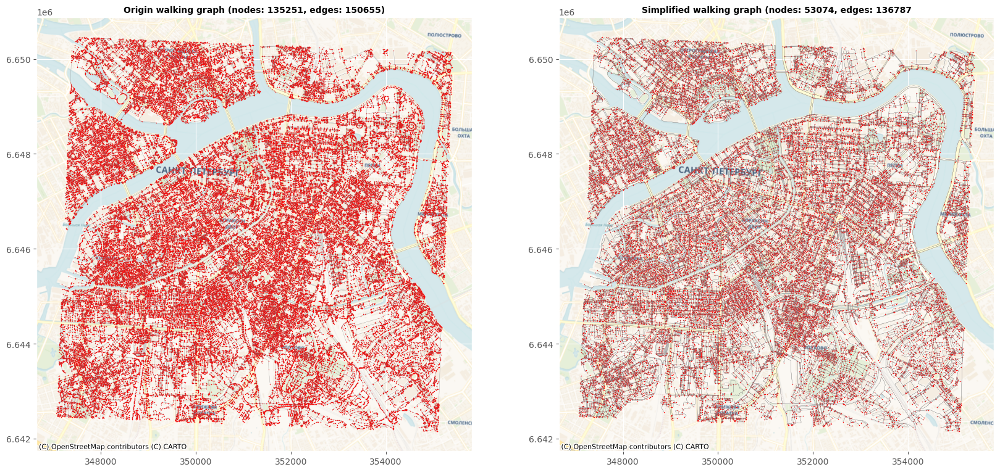

In [292]:
import contextily as cx
from matplotlib import pyplot as plt
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

with plt.style.context('ggplot'):
  fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))

  # plot edges and nodes of origin graph
  ax1 = edges.plot(ax=axes[0], color="gray", linewidth=0.2)
  ax1 = nodes.plot(ax=ax1, color="red", markersize=0.3)
  cx.add_basemap(ax=ax1, crs=nodes.crs.to_string(), source=cx.providers.CartoDB.Voyager)

  # plot edges and nodes of simplified graph
  ax2 = edges_s.plot(ax=axes[1], color="gray", linewidth=0.2)
  ax2 = nodes_s.plot(ax=ax2, color="red", markersize=0.3)
  cx.add_basemap(ax=ax2, crs=nodes_s.crs.to_string(), source=cx.providers.CartoDB.Voyager)

  # add titles to maps
  ax1.set_title(f'Origin {network_type} graph (nodes: {len(nodes)}, edges: {len(edges)})', fontsize=10, fontweight='bold')
  ax2.set_title(f'Simplified {network_type} graph (nodes: {len(nodes_s)}, edges: {len(edges_s)}', fontsize=10, fontweight='bold')

  fp = config['dir_osm']+f'images/{network_type}_graph_compare_'+start+'.png'
  plt.savefig(fp, bbox_inches='tight')
  logger.info(f'save {network_type} graph to {fp}')
  plt.show()

INFO:root:save walking graph to /content/drive/MyDrive/vkr/kmu/src/osm/images/walking_graph_compare_zoom_2024_05_06.png


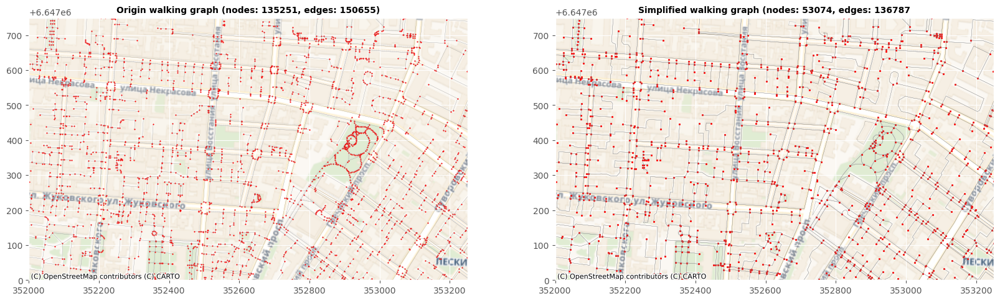

In [306]:
import contextily as cx
from matplotlib import pyplot as plt
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

with plt.style.context('ggplot'):
  fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))

  # plot edges and nodes of origin graph
  ax1 = edges.plot(ax=axes[0], color="gray", linewidth=0.2)
  ax1 = nodes.plot(ax=ax1, color="red", markersize=1)
  #plt.setp(ax1, xlim=(349000, 349500), ylim=(6650000, 6650500))
  #plt.setp(ax1, xlim=(352500, 354000), ylim=(6646000, 6648000))
  plt.setp(ax1, xlim=(352000, 353250), ylim=(6647000, 6647750))
  cx.add_basemap(ax=ax1, crs=nodes.crs.to_string(), source=cx.providers.CartoDB.Voyager)

  # plot edges and nodes of simplified graph
  ax2 = edges_s.plot(ax=axes[1], color="gray", linewidth=0.2)
  ax2 = nodes_s.plot(ax=ax2, color="red", markersize=3)
  #plt.setp(ax2, xlim=(349000, 349500), ylim=(6650000, 6650500))
  #plt.setp(ax2, xlim=(352500, 354000), ylim=(6646000, 6648000))
  plt.setp(ax2, xlim=(352000, 353250), ylim=(6647000, 6647750))
  cx.add_basemap(ax=ax2, crs=nodes_s.crs.to_string(), source=cx.providers.CartoDB.Voyager)

  # add titles to maps
  ax1.set_title(f'Origin {network_type} graph (nodes: {len(nodes)}, edges: {len(edges)})', fontsize=10, fontweight='bold')
  ax2.set_title(f'Simplified {network_type} graph (nodes: {len(nodes_s)}, edges: {len(edges_s)}', fontsize=10, fontweight='bold')

  fp = config['dir_osm']+f'images/{network_type}_graph_compare_zoom_'+start+'.png'
  plt.savefig(fp, bbox_inches='tight')
  logger.info(f'save {network_type} graph to {fp}')
  plt.show()

INFO:root:save walking graph to /content/drive/MyDrive/vkr/kmu/src/osm/images/walking_graph_compare_zoom_extra_2024_05_06.png


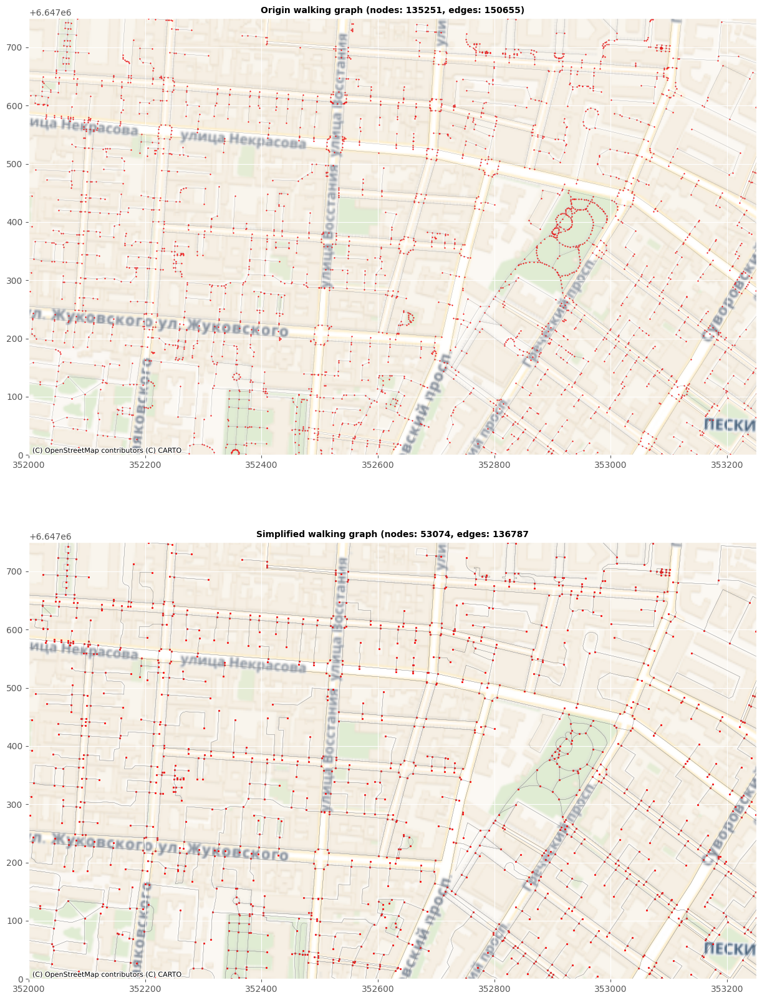

In [307]:
import contextily as cx
from matplotlib import pyplot as plt
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

with plt.style.context('ggplot'):
  fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(20, 20))

  # plot edges and nodes of origin graph
  ax1 = edges.plot(ax=axes[0], color="gray", linewidth=0.2)
  ax1 = nodes.plot(ax=ax1, color="red", markersize=1)
  #plt.setp(ax1, xlim=(349000, 349500), ylim=(6650000, 6650500))
  #plt.setp(ax1, xlim=(352500, 354000), ylim=(6646000, 6648000))
  plt.setp(ax1, xlim=(352000, 353250), ylim=(6647000, 6647750))
  cx.add_basemap(ax=ax1, crs=nodes.crs.to_string(), source=cx.providers.CartoDB.Voyager)

  # plot edges and nodes of simplified graph
  ax2 = edges_s.plot(ax=axes[1], color="gray", linewidth=0.2)
  ax2 = nodes_s.plot(ax=ax2, color="red", markersize=3)
  #plt.setp(ax2, xlim=(349000, 349500), ylim=(6650000, 6650500))
  #plt.setp(ax2, xlim=(352500, 354000), ylim=(6646000, 6648000))
  plt.setp(ax2, xlim=(352000, 353250), ylim=(6647000, 6647750))
  cx.add_basemap(ax=ax2, crs=nodes_s.crs.to_string(), source=cx.providers.CartoDB.Voyager)

  # add titles to maps
  ax1.set_title(f'Origin {network_type} graph (nodes: {len(nodes)}, edges: {len(edges)})', fontsize=10, fontweight='bold')
  ax2.set_title(f'Simplified {network_type} graph (nodes: {len(nodes_s)}, edges: {len(edges_s)}', fontsize=10, fontweight='bold')

  fp = config['dir_osm']+f'images/{network_type}_graph_compare_zoom_extra_'+start+'.png'
  plt.savefig(fp, bbox_inches='tight')
  logger.info(f'save {network_type} graph to {fp}')
  plt.show()

In [301]:
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

fp = ''
if 'bbox' in config:
  fp = DIR_OSM + 'spb_bbox_' + start + '.gpkg'
  nodes_s.to_file(fp, driver='GPKG', layer=f'{network_type}_nodes', encoding='utf-8')
  edges_s.to_file(fp, driver='GPKG', layer=f'{network_type}_edges', encoding='utf-8')
  logger.info(f'save {network_type} nodes and edges of simplified graph to {fp}')
else:
  fp = DIR_OSM + 'spb_' + start + '.gpkg'
  nodes_s.to_file(fp, driver='GPKG', layer=f'{network_type}_nodes', encoding='utf-8')
  edges_s.to_file(fp, driver='GPKG', layer=f'{network_type}_edges', encoding='utf-8')
  logger.info(f'save {network_type} nodes and edges of simplified graph to {fp}')

INFO:root:save walking nodes and edges of simplified graph to /content/drive/MyDrive/vkr/kmu/src/osm/spb_bbox_2024_05_06.gpkg


In [302]:
from geopandas import read_file


nodes_from_gpkg = read_file(fp, layer=f'{network_type}_nodes').set_index('id')
edges_from_gpkg = read_file(fp, layer=f'{network_type}_edges')

if nodes_s.shape[0] == nodes_from_gpkg.shape[0] and nodes_s.crs == nodes_from_gpkg.crs:
  logger.info(f'{network_type} nodes and edges of simplified graph successfully loaded from gpkg')

INFO:root:walking nodes and edges of simplified graph successfully loaded from gpkg


In [304]:
nodes_from_gpkg.head(2)

,x,y,geometry
id,,,
10240355599,350768.977867,6.647817e+06,POINT (350768.978 6647816.641)
1591433310,350772.206656,6.647831e+06,POINT (350772.207 6647830.545)


In [305]:
edges_from_gpkg.head(2)

,u,v,length,oneway,highway,geometry
0,10240355599,1591433310,14.247,no,unclassified,"LINESTRING (350768.978 6647816.641, 350769.630..."
1,1591433310,9296451194,24.230,no,unclassified,"LINESTRING (350772.207 6647830.545, 350777.960..."


## Заметки

In [ ]:
from osmnx import projection, simplification


graph_s_proj = projection.project_graph(graph_s, to_crs=config['crs'])

# Simplify to get real intersections only
# (consolidate nodes within a distance from eachother)
walking_g_prj_simplified = simplification.consolidate_intersections(
    # Graph to simplify
    graph_s_proj,
    # buffer around each node (project the graph beforehand)
    tolerance=5,
    # Get result as graph (False to get nodes only as gdf)
    rebuild_graph=True,
    # no dead ends
    dead_ends=False,
    # Reconnect (False to get intersections only)
    reconnect_edges=True
)